# Advanced Approach for Trace Clustering

In [1]:
%reload_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import pm4py
import numpy as np
import glob
from pathlib import Path
from karateclub.node_embedding.neighbourhood import Node2Vec, Walklets
from karateclub.node_embedding import GraphWave
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import normalize
from umap import UMAP
from minisom import MiniSom
from clustpy.deep import DEC, IDEC
from practical.ProcessMining.group1.shared import utils
from practical.ProcessMining.group1.shared.visualizer import Visualizer

visualizer = Visualizer()
LOG_DIR_PATH = "data/BPI2020"

def get_traces_from_log(log):
    ids = list(log["case:concept:name"].unique())
    traces = [["".join(x) for x in list(log[log["case:concept:name"] == case_id]["concept:name"])] for case_id in ids]
    return ids, traces

def create_graph(log):
    graph = nx.Graph()
    dfg = pm4py.discover_dfg(log)
    for edge in dfg[0].items():
        graph.add_weighted_edges_from([(edge[0][0], edge[0][1], edge[1])])
    return graph

def apply_mapping(graph, traces):
    mapping = dict(zip(graph.nodes(), [i for i in range(len(graph.nodes()))]))
    graph = nx.relabel_nodes(graph, mapping)
    mapped_traces = [[mapping[a] for a in trace] for trace in traces]
    return graph, mapped_traces

def generate_node2vec_node_embeddings(graph, mapped_traces):
    model = Node2Vec(dimensions=8)
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(8))
        vectors.append(np.array(trace_vector).mean(axis=0))
    embedding = normalize(vectors, norm='l2')
    return embedding

def generate_node2vec_edge_embeddings(graph, mapped_traces):
    model = Node2Vec(dimensions=8)
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for i in range(len(trace)-1):
            emb1, emb2 = embeddings[trace[i]], embeddings[trace[i+1]]
            trace_vector.append((emb1 + emb2)/2.0)
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(8))
        vectors.append(np.array(trace_vector).mean(axis=0))
    embedding = normalize(vectors, norm='l2')
    return embedding

def generate_graphwave_embeddings(graph, mapped_traces):
    model = GraphWave()
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        vectors.append(np.array(trace_vector).mean(axis=0))
    embedding = normalize(vectors, norm='l2')
    return embedding

def generate_walklets_node_embeddings(graph, mapped_traces):
    model = Walklets(dimensions=32, workers=-1, window_size=4)
    model.fit(graph)
    embeddings = model.get_embedding()
    vectors = []
    for trace in mapped_traces:
        trace_vector = []
        for token in trace:
            trace_vector.append(embeddings[token])
        if len(trace_vector) == 0:
            trace_vector.append(np.zeros(32))
        vectors.append(np.array(trace_vector).mean(axis=0))
    embedding = normalize(vectors, norm='l2')
    return embedding
    
    
def get_encoding_df(vectors, ids):
    encoded_df = pd.DataFrame(vectors, columns=[f'{i}' for i in range(len(vectors[0]))])
    encoded_df.insert(0, "case", ids)
    return encoded_df

def cluster_data_kmeans(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    encoded_df["cluster"] = KMeans(n_clusters=n_clusters, random_state=42, **kwargs).fit_predict(X)
    return encoded_df

def cluster_data_gmm(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    encoded_df["cluster"] = GaussianMixture(n_components=n_clusters, random_state=42, **kwargs).fit_predict(X)
    return encoded_df

def cluster_data_som(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    som = MiniSom(1, n_clusters, X.shape[1], sigma=0.6, learning_rate=0.5, **kwargs)
    som.train_batch(X.values, 3000)
    encoded_df["cluster"] = [som.winner(x)[1] for x in X.values]
    return encoded_df

def cluster_data_hierarchical(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:]
    encoded_df["cluster"] = AgglomerativeClustering(n_clusters=n_clusters, **kwargs).fit_predict(X)
    return encoded_df

def cluster_data_dec(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:].to_numpy()
    dec = DEC(n_clusters=n_clusters, embedding_size=X.shape[1], **kwargs)
    encoded_df["cluster"] = dec.fit_predict(X)
    return encoded_df

def cluster_data_idec(encoded_df, n_clusters=5, **kwargs):
    X = encoded_df.iloc[:, 1:].to_numpy()
    idec = IDEC(n_clusters=n_clusters, embedding_size=X.shape[1], **kwargs)
    encoded_df["cluster"] = idec.fit_predict(X)
    return encoded_df

def add_clusters_to_log(log, encoded_df):
    log_with_clusters = log.copy()
    log_with_clusters["cluster"] = log_with_clusters["case:concept:name"].map(encoded_df.set_index("case")["cluster"])
    return log_with_clusters

def split_log_by_clusters(log_with_clusters):
    clustered_logs = {}
    for cluster in log_with_clusters["cluster"].unique():
        clustered_logs[cluster] = log_with_clusters[log_with_clusters["cluster"] == cluster]
    return clustered_logs

def mine_petri_nets(clustered_logs):
    for cluster, cluster_log in sorted(clustered_logs.items()):
        print(f'=== Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases ===')
        viz_petri_net(cluster_log)
    
def viz_petri_net(log):
    net, im, fm = pm4py.algo.discovery.alpha.algorithm.apply(log)
    #replay = TokenReplay(log, net, im, fm, "AM")
    #replay.run()
    #tokens = replay.get_unconformity_tokens()
    graph = visualizer.build_petri_net(net, im, fm)
    visualizer.display(graph)

def evaluate_clustering(X, clusters):
    score = silhouette_score(X, clusters)
    print(f'Silhouette Score: {score}')
    
def plot_dimension_reduction(X, clusters):
    plt.figure(figsize=(10, 5))

    title_fontsize = 16
    legend_fontsize = 14
    
    # PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(X)
    ax1 = plt.subplot(1, 2, 1)
    for cluster in np.unique(clusters):
        ix = np.where(clusters == cluster)
        ax1.scatter(pca_result[ix, 0], pca_result[ix, 1], label=cluster, s=10)
    ax1.set_title('PCA - Clustering Results', fontsize=title_fontsize)
    
    # UMAP
    umap = UMAP(n_components=2)
    umap_result = umap.fit_transform(X)
    ax2 = plt.subplot(1, 2, 2)
    for cluster in np.unique(clusters):
        ix = np.where(clusters == cluster)
        ax2.scatter(umap_result[ix, 0], umap_result[ix, 1], label=cluster, s=10)
    ax2.set_title('UMAP - Clustering Results', fontsize=title_fontsize)
    
    handles, labels = ax1.get_legend_handles_labels()
    plt.figlegend(handles, labels, loc='lower center', ncol=5, labelspacing=0., fontsize=legend_fontsize, bbox_to_anchor=(0.5, -0.1))
    
    plt.show()

## Data Exploration and Preprocessing

Before we start with the advanced approach, we need to load the event logs and perform some basic data exploration and preprocessing steps. 
We will load the event logs, print some basic statistics, and visualize the event log in its initial spaghetti model form.

_"After submission by the employee, the request is sent for approval to the travel administration. If approved, the request is then forwarded to the budget owner and after that to the supervisor. If the budget owner and supervisor are the same person, then only one of these steps is taken. In some cases, the director also needs to approve the request.The process finished with either the trip taking place or a payment being requested and payed. "_

[BPI Challenge 2020: Domestic Declarations](https://data.4tu.nl/datasets/6a0a26d2-82d0-4018-b1cd-89afb0e8627f)

In [2]:
event_logs = {}
for file_path in glob.glob(f'{LOG_DIR_PATH}/*.xes'):
    print(f'Loading {file_path} ...')
    log = utils.import_xes(file_path)
    event_logs[file_path] = log
event_logs = dict(sorted(event_logs.items()))

Loading data/BPI2020/DomesticDeclarations.xes ...


parsing log, completed traces ::   0%|          | 0/10500 [00:00<?, ?it/s]

In [3]:
for file_path, log in event_logs.items():
    print(f'{Path(file_path).stem}, {log.shape[0]} events, {log["case:concept:name"].unique().shape[0]} cases')
keys = list(event_logs.keys())

DomesticDeclarations, 56437 events, 10500 cases


In [4]:
log = event_logs[keys[0]]

In [5]:
# most frequent activities
log["concept:name"].value_counts()

Declaration SUBMITTED by EMPLOYEE             11531
Declaration FINAL_APPROVED by SUPERVISOR      10131
Payment Handled                               10044
Request Payment                               10040
Declaration APPROVED by ADMINISTRATION         8202
Declaration APPROVED by BUDGET OWNER           2820
Declaration REJECTED by EMPLOYEE               1365
Declaration REJECTED by ADMINISTRATION          952
Declaration APPROVED by PRE_APPROVER            685
Declaration REJECTED by SUPERVISOR              293
Declaration SAVED by EMPLOYEE                   135
Declaration REJECTED by MISSING                  91
Declaration REJECTED by PRE_APPROVER             86
Declaration REJECTED by BUDGET OWNER             59
Declaration FOR_APPROVAL by SUPERVISOR            1
Declaration FOR_APPROVAL by PRE_APPROVER          1
Declaration FOR_APPROVAL by ADMINISTRATION        1
Name: concept:name, dtype: int64

In [6]:
trace_per_case = log.groupby("case:concept:name")["concept:name"].aggregate(lambda x: tuple(x))
# unique traces
print(f'Unique traces: {trace_per_case.unique().shape[0]}')
# most frequent traces
for trace, freq in trace_per_case.value_counts().head().items():
    print(f'{trace} ({freq} occurrences)')
# least frequent traces
for trace, freq in trace_per_case.value_counts().tail().items():
    print(f'{trace} ({freq} occurrences)')

Unique traces: 99
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (4618 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration APPROVED by BUDGET OWNER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (2473 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (1392 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled') (575 occurrences)
('Declaration SUBMITTED by EMPLOYEE', 'Declaration REJECTED by ADMINISTRATION', 'Declaration REJECTED by EMPLOYEE', 'Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by ADMINISTRATION', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Paym

Average trace length: 5.374952380952381


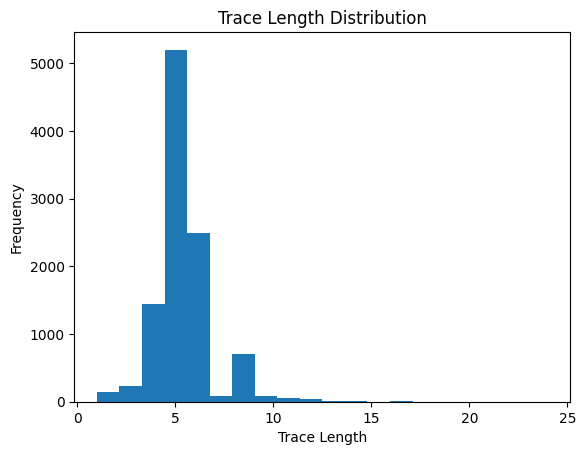

In [7]:
# average trace length
trace_lengths = [len(trace) for trace in trace_per_case]
print(f'Average trace length: {np.mean(trace_lengths)}')
# trace length distribution
plt.hist(trace_lengths, bins=20)
plt.xlabel('Trace Length')
plt.ylabel('Frequency')
plt.title('Trace Length Distribution')
plt.show()

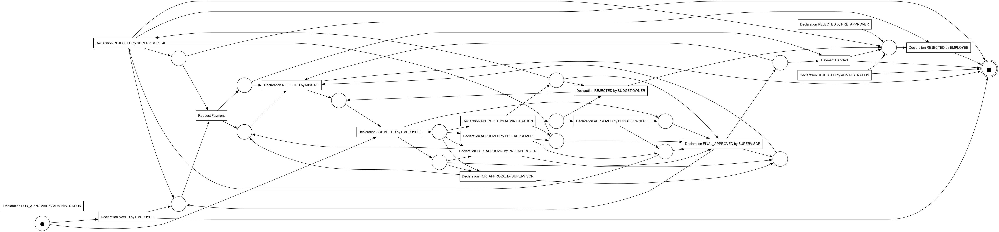

In [8]:
viz_petri_net(log)

## Graph Encodings

Node2Vec, GraphWave, and Walklets are used to encode the graph structure of the event log. Afterward L2 normalization is applied to the embeddings. 

In [9]:
ids, traces = get_traces_from_log(log)

for id, trace in zip(ids, traces):
    print(f'{id}: {trace}')

declaration 86791: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86795: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86800: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration APPROVED by PRE_APPROVER', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86731: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86735: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86805: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED by SUPERVISOR', 'Request Payment', 'Payment Handled']
declaration 86809: ['Declaration SUBMITTED by EMPLOYEE', 'Declaration FINAL_APPROVED b

In [10]:
graph = create_graph(log)
graph, mapped_traces = apply_mapping(graph, traces)

for id, trace in zip(ids, mapped_traces):
    print(f'{id}: {trace}')

declaration 86791: [10, 2, 8, 7]
declaration 86795: [10, 5, 2, 8, 7]
declaration 86800: [10, 5, 2, 8, 7]
declaration 86731: [10, 2, 8, 7]
declaration 86735: [10, 2, 8, 7]
declaration 86805: [10, 2, 8, 7]
declaration 86809: [10, 2, 6, 10, 2, 8, 7]
declaration 86816: [10, 2, 8, 7]
declaration 86716: [10, 2, 8, 7]
declaration 86720: [10, 2, 6, 10, 15, 14, 10, 5, 2, 8, 7]
declaration 86820: [10, 2, 8, 7]
declaration 86824: [10, 2, 8, 7]
declaration 86828: [10, 2, 8, 7]
declaration 86739: [10, 2, 6, 10, 2, 8, 7]
declaration 86746: [10, 2, 8, 7]
declaration 86750: [16]
declaration 86752: [10, 2, 8, 7]
declaration 86756: [10, 2, 8, 7]
declaration 86832: [10, 2, 8, 7]
declaration 86836: [10, 2, 8, 7]
declaration 86760: [10, 2, 8, 7]
declaration 86764: [10, 2, 6, 10, 2, 8, 7]
declaration 86771: [10, 5, 2, 8, 7]
declaration 86840: [10, 2, 6, 10, 2, 8, 7]
declaration 86776: [10, 2, 6, 10, 2, 8, 7]
declaration 86783: [10, 2, 8, 7]
declaration 86847: [10, 2, 8, 7]
declaration 86851: [10, 2, 8, 7]
d

In [11]:
node2vec_node_embeddings = get_encoding_df(generate_node2vec_node_embeddings(graph, mapped_traces), ids)
node2vec_edge_embeddings = get_encoding_df(generate_node2vec_edge_embeddings(graph, mapped_traces), ids)

graphWave_node_embeddings = get_encoding_df(generate_graphwave_embeddings(graph, mapped_traces), ids)

walklets_node_embeddings = get_encoding_df(generate_walklets_node_embeddings(graph, mapped_traces), ids)

2024-07-04 15:47:20,605:[WARNING](pygsp.graphs.graph.check_weights): The main diagonal of the weight matrix is not 0!


In [12]:
graphWave_node_embeddings

,case,0,1,2,3,4,5,6,7,8,...,390,391,392,393,394,395,396,397,398,399
0,declaration 86791,0.083030,0.083018,0.082981,0.082920,0.082834,0.082725,0.082593,0.082438,0.082261,...,0.006202,0.006137,0.006069,0.005997,0.005922,0.005843,0.005760,0.005675,0.005587,0.005497
1,declaration 86795,0.081450,0.081436,0.081394,0.081324,0.081226,0.081102,0.080952,0.080776,0.080577,...,0.005035,0.005067,0.005100,0.005133,0.005166,0.005198,0.005229,0.005257,0.005283,0.005306
2,declaration 86800,0.081450,0.081436,0.081394,0.081324,0.081226,0.081102,0.080952,0.080776,0.080577,...,0.005035,0.005067,0.005100,0.005133,0.005166,0.005198,0.005229,0.005257,0.005283,0.005306
3,declaration 86731,0.083030,0.083018,0.082981,0.082920,0.082834,0.082725,0.082593,0.082438,0.082261,...,0.006202,0.006137,0.006069,0.005997,0.005922,0.005843,0.005760,0.005675,0.005587,0.005497
4,declaration 86735,0.083030,0.083018,0.082981,0.082920,0.082834,0.082725,0.082593,0.082438,0.082261,...,0.006202,0.006137,0.006069,0.005997,0.005922,0.005843,0.005760,0.005675,0.005587,0.005497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10495,declaration 138337,0.082128,0.082115,0.082077,0.082012,0.081923,0.081809,0.081671,0.081509,0.081324,...,0.007238,0.007179,0.007120,0.007064,0.007009,0.006956,0.006905,0.006857,0.006812,0.006770
10496,declaration 138343,0.082128,0.082115,0.082077,0.082012,0.081923,0.081809,0.081671,0.081509,0.081324,...,0.007238,0.007179,0.007120,0.007064,0.007009,0.006956,0.006905,0.006857,0.006812,0.006770
10497,declaration 138349,0.083082,0.083070,0.083034,0.082974,0.082890,0.082783,0.082653,0.082501,0.082327,...,0.007011,0.007006,0.006998,0.006988,0.006975,0.006960,0.006942,0.006921,0.006898,0.006873
10498,declaration 138354,0.083082,0.083070,0.083034,0.082974,0.082890,0.082783,0.082653,0.082501,0.082327,...,0.007011,0.007006,0.006998,0.006988,0.006975,0.006960,0.006942,0.006921,0.006898,0.006873


## Clustering with KMeans

### Node2Vec Node Embeddings

In [56]:
clustered_data_kmeans_node2vec_node = cluster_data_kmeans(node2vec_node_embeddings, n_clusters=10)
clustered_logs_kmeans_node2vec_node = split_log_by_clusters(add_clusters_to_log(log, clustered_data_kmeans_node2vec_node))

for cluster, cluster_log in sorted(clustered_logs_kmeans_node2vec_node.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 23160 events, 4627 cases
Cluster 1: 830 events, 125 cases
Cluster 2: 5851 events, 678 cases
Cluster 3: 662 events, 197 cases
Cluster 4: 134 events, 134 cases
Cluster 5: 5861 events, 1433 cases
Cluster 6: 3351 events, 666 cases
Cluster 7: 14918 events, 2483 cases
Cluster 8: 687 events, 71 cases
Cluster 9: 983 events, 86 cases


=== Cluster 0: 23160 events, 4627 cases ===


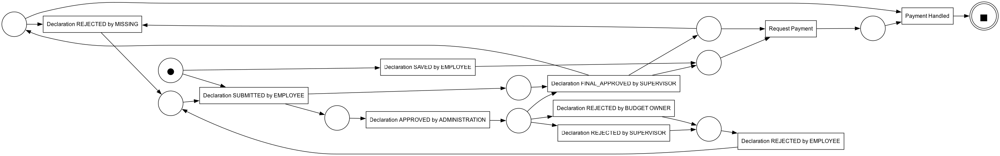

=== Cluster 1: 830 events, 125 cases ===


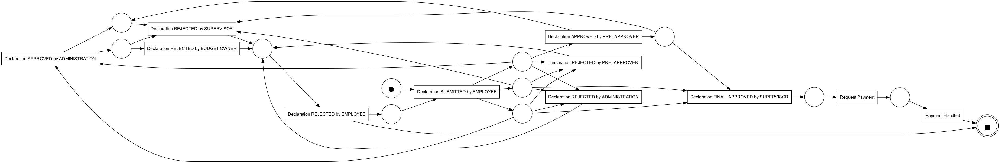

=== Cluster 2: 5851 events, 678 cases ===


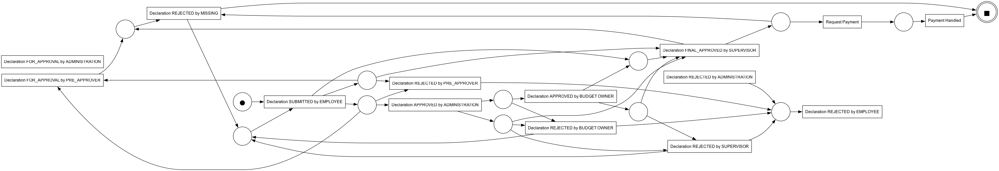

=== Cluster 3: 662 events, 197 cases ===


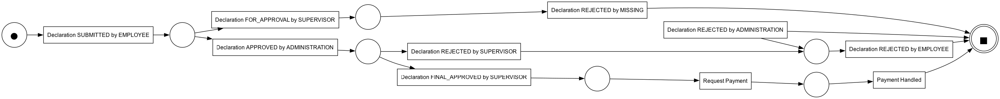

=== Cluster 4: 134 events, 134 cases ===


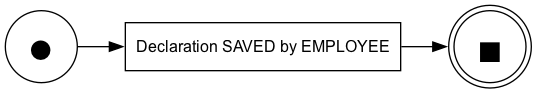

=== Cluster 5: 5861 events, 1433 cases ===


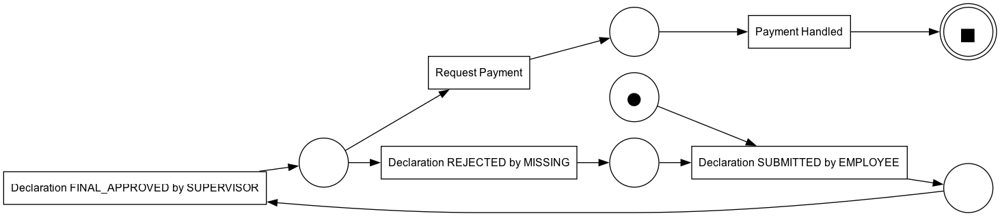

=== Cluster 6: 3351 events, 666 cases ===


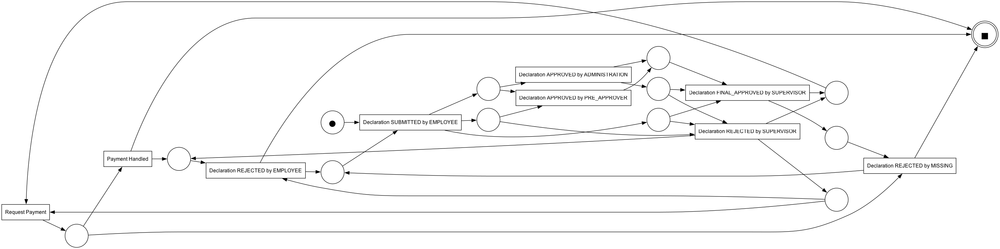

=== Cluster 7: 14918 events, 2483 cases ===


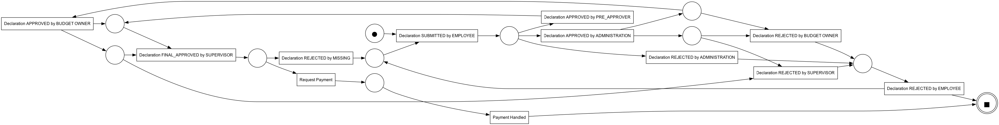

=== Cluster 8: 687 events, 71 cases ===


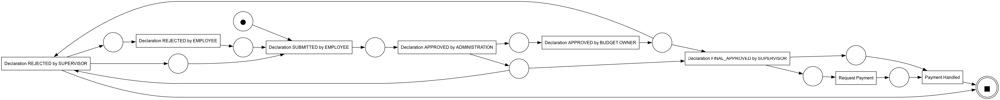

=== Cluster 9: 983 events, 86 cases ===


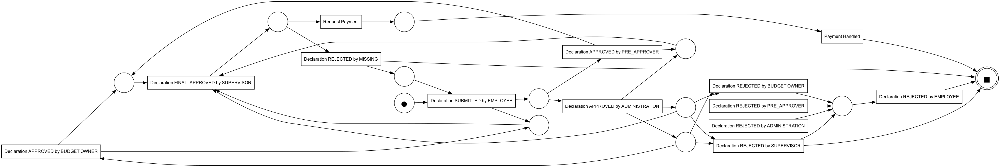

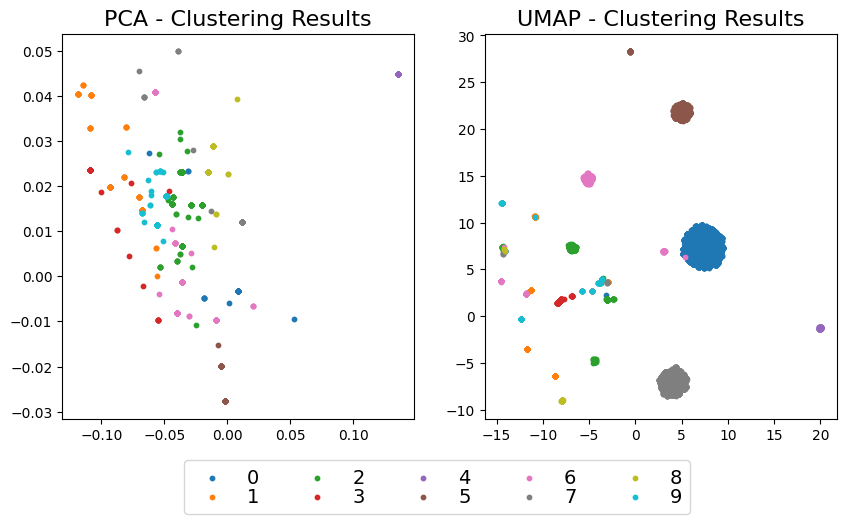

Silhouette Score: 0.9021794072215299


In [57]:
mine_petri_nets(clustered_logs_kmeans_node2vec_node)
plot_dimension_reduction(clustered_data_kmeans_node2vec_node.iloc[:, 1:-1], clustered_data_kmeans_node2vec_node['cluster'])
evaluate_clustering(clustered_data_kmeans_node2vec_node.iloc[:, 1:-1], clustered_data_kmeans_node2vec_node["cluster"])

### Node2Vec Edge Embeddings

In [15]:
clustered_data_kmeans_node2vec_edge = cluster_data_kmeans(node2vec_edge_embeddings, n_clusters=5)
clustered_logs_kmeans_node2vec_edge = split_log_by_clusters(add_clusters_to_log(log, clustered_data_kmeans_node2vec_edge))

for cluster, cluster_log in sorted(clustered_logs_kmeans_node2vec_edge.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 29066 events, 6083 cases
Cluster 1: 134 events, 134 cases
Cluster 2: 11605 events, 1592 cases
Cluster 3: 774 events, 213 cases
Cluster 4: 14858 events, 2478 cases


=== Cluster 0: 29066 events, 6083 cases ===


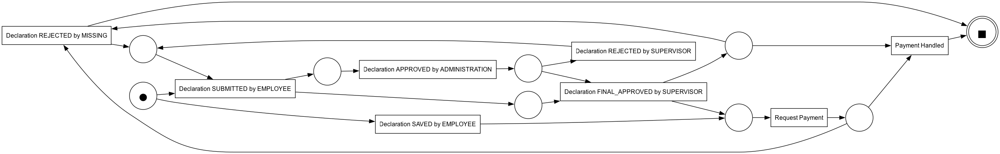

=== Cluster 1: 134 events, 134 cases ===


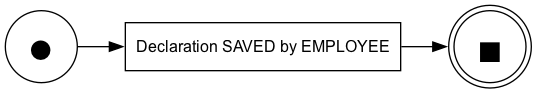

=== Cluster 2: 11605 events, 1592 cases ===


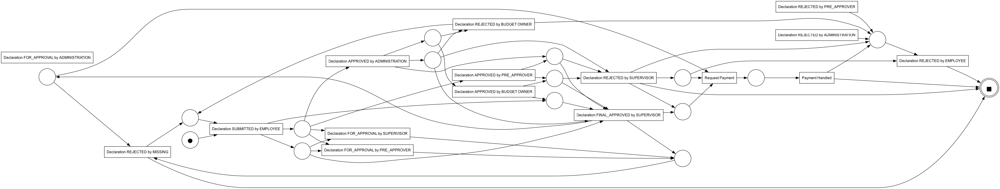

=== Cluster 3: 774 events, 213 cases ===


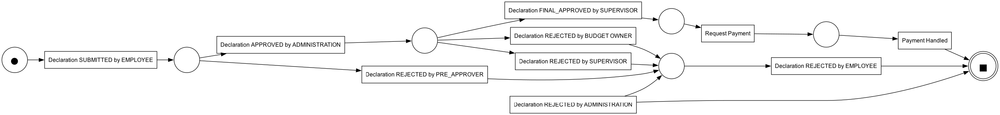

=== Cluster 4: 14858 events, 2478 cases ===


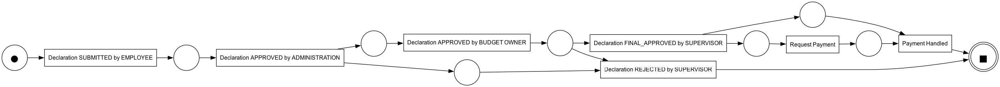

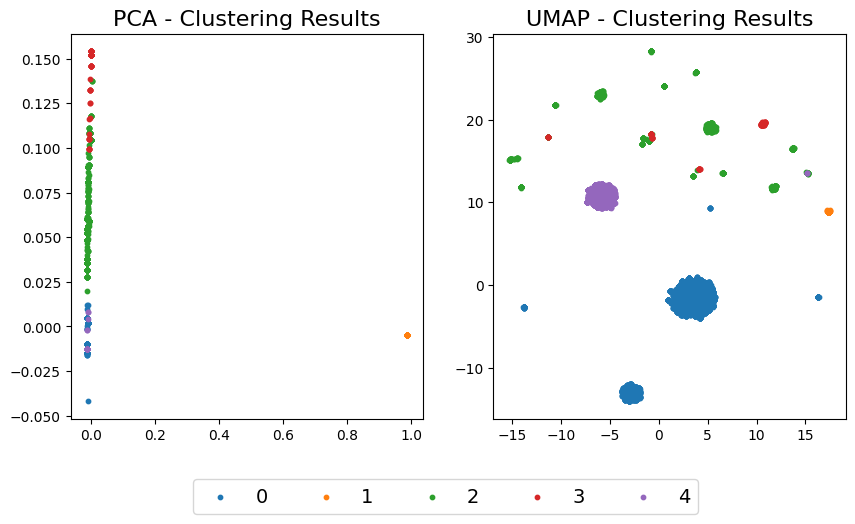

Silhouette Score: 0.69148665066876


In [16]:
mine_petri_nets(clustered_logs_kmeans_node2vec_edge)
plot_dimension_reduction(clustered_data_kmeans_node2vec_edge.iloc[:, 1:-1], clustered_data_kmeans_node2vec_edge['cluster'])
evaluate_clustering(clustered_data_kmeans_node2vec_edge.iloc[:, 1:-1], clustered_data_kmeans_node2vec_edge["cluster"])

### GraphWave Embeddings

In [17]:
clustered_data_kmeans_graphWave = cluster_data_kmeans(graphWave_node_embeddings, n_clusters=5)
clustered_logs_kmeans_graphWave = split_log_by_clusters(add_clusters_to_log(log, clustered_data_kmeans_graphWave))

for cluster, cluster_log in sorted(clustered_logs_kmeans_graphWave.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 28658 events, 6010 cases
Cluster 1: 1246 events, 311 cases
Cluster 2: 134 events, 134 cases
Cluster 3: 11240 events, 1524 cases
Cluster 4: 15159 events, 2521 cases


=== Cluster 0: 28658 events, 6010 cases ===


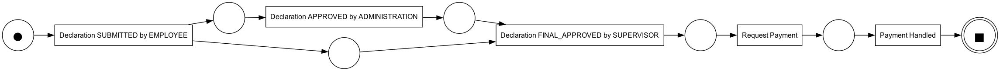

=== Cluster 1: 1246 events, 311 cases ===


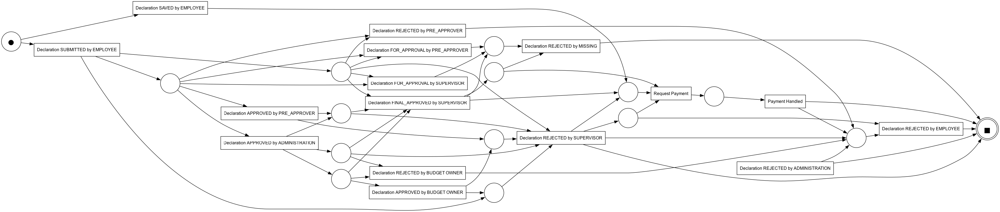

=== Cluster 2: 134 events, 134 cases ===


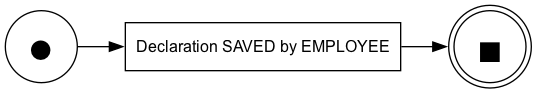

=== Cluster 3: 11240 events, 1524 cases ===


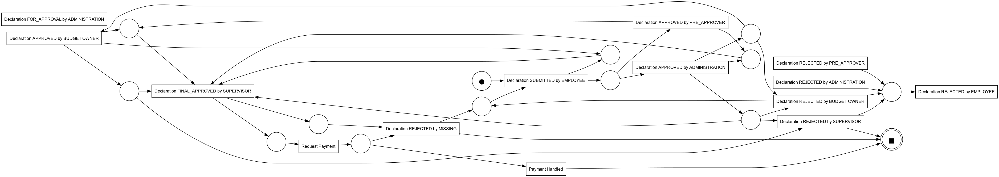

=== Cluster 4: 15159 events, 2521 cases ===


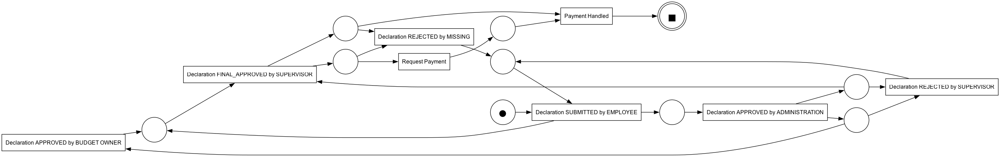

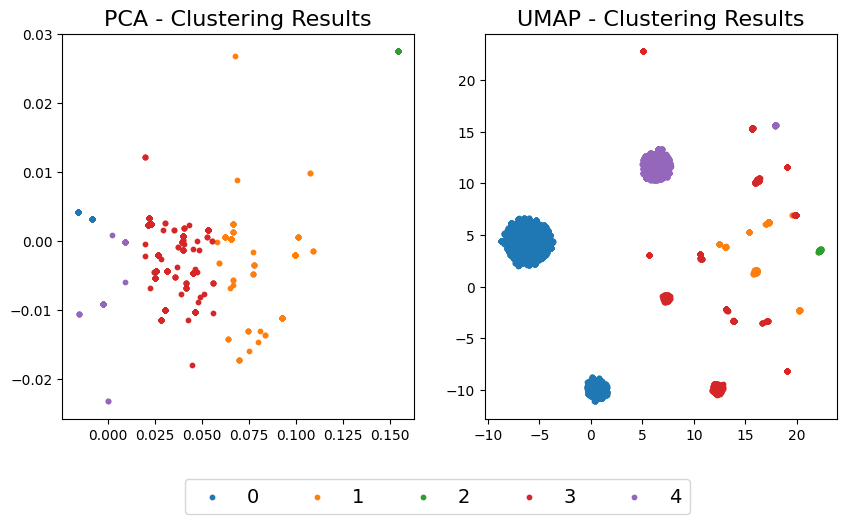

Silhouette Score: 0.8005487042168031


In [18]:
mine_petri_nets(clustered_logs_kmeans_graphWave)
plot_dimension_reduction(clustered_data_kmeans_graphWave.iloc[:, 1:-1], clustered_data_kmeans_graphWave['cluster'])
evaluate_clustering(clustered_data_kmeans_graphWave.iloc[:, 1:-1], clustered_data_kmeans_graphWave["cluster"])

### Walklets Embeddings

In [19]:
clustered_data_kmeans_walklets = cluster_data_kmeans(walklets_node_embeddings, n_clusters=5)
clustered_logs_kmeans_walklets = split_log_by_clusters(add_clusters_to_log(log, clustered_data_kmeans_walklets))

for cluster, cluster_log in sorted(clustered_logs_kmeans_walklets.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 24007 events, 4722 cases
Cluster 1: 2092 events, 375 cases
Cluster 2: 14431 events, 2701 cases
Cluster 3: 15770 events, 2567 cases
Cluster 4: 137 events, 135 cases


=== Cluster 0: 24007 events, 4722 cases ===


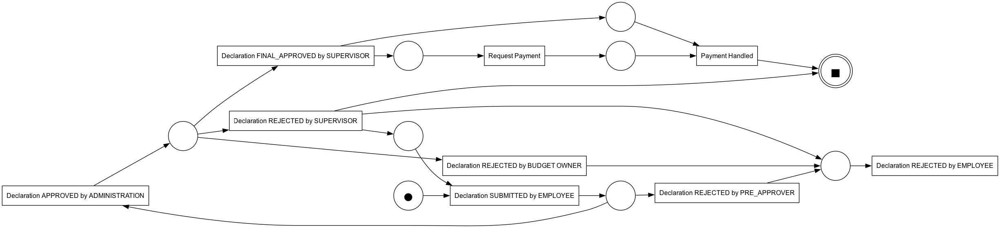

=== Cluster 1: 2092 events, 375 cases ===


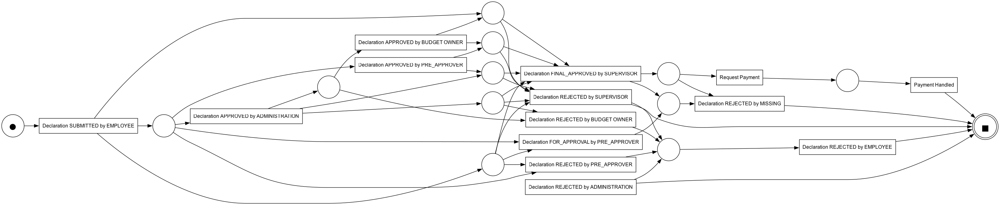

=== Cluster 2: 14431 events, 2701 cases ===


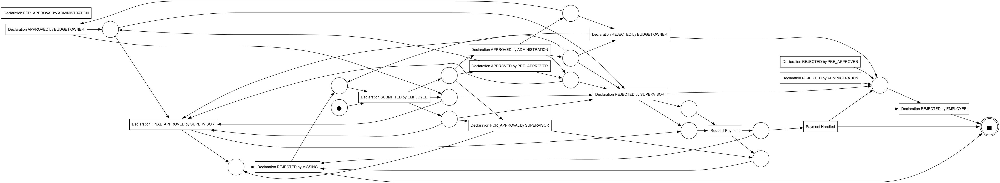

=== Cluster 3: 15770 events, 2567 cases ===


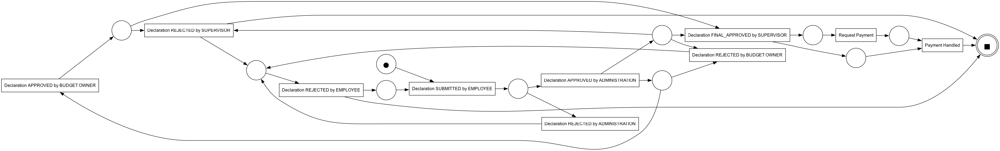

=== Cluster 4: 137 events, 135 cases ===


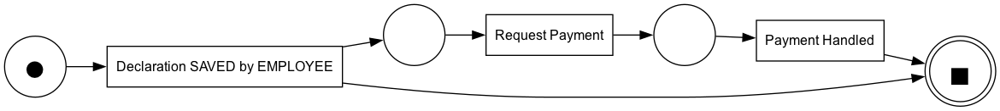

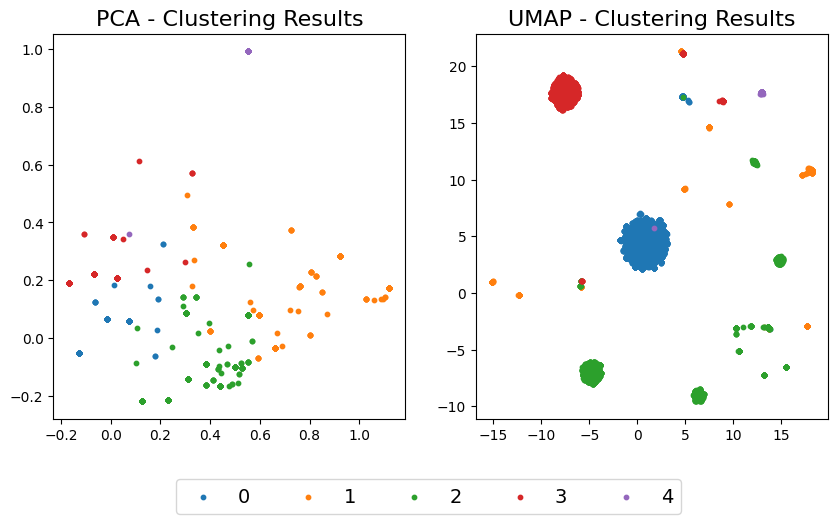

Silhouette Score: 0.7658228341879129


In [20]:
mine_petri_nets(clustered_logs_kmeans_walklets)
plot_dimension_reduction(clustered_data_kmeans_walklets.iloc[:, 1:-1], clustered_data_kmeans_walklets['cluster'])
evaluate_clustering(clustered_data_kmeans_walklets.iloc[:, 1:-1], clustered_data_kmeans_walklets["cluster"])

## Clustering with Agglomerative Clustering

In [54]:
clustered_data_hierarchical_node2vec_node = cluster_data_hierarchical(node2vec_node_embeddings, n_clusters=5)
clustered_logs_hierarchical_node2vec_node = split_log_by_clusters(add_clusters_to_log(log, clustered_data_hierarchical_node2vec_node))

for cluster, cluster_log in sorted(clustered_logs_hierarchical_node2vec_node.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 8361 events, 1715 cases
Cluster 1: 4013 events, 863 cases
Cluster 2: 38078 events, 7110 cases
Cluster 3: 5851 events, 678 cases
Cluster 4: 134 events, 134 cases


=== Cluster 0: 8361 events, 1715 cases ===


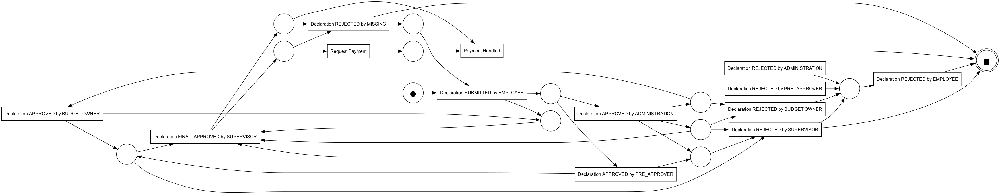

=== Cluster 1: 4013 events, 863 cases ===


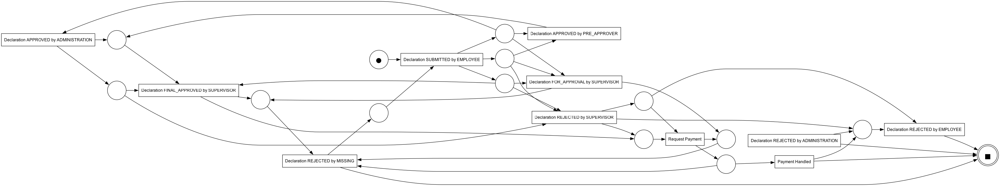

=== Cluster 2: 38078 events, 7110 cases ===


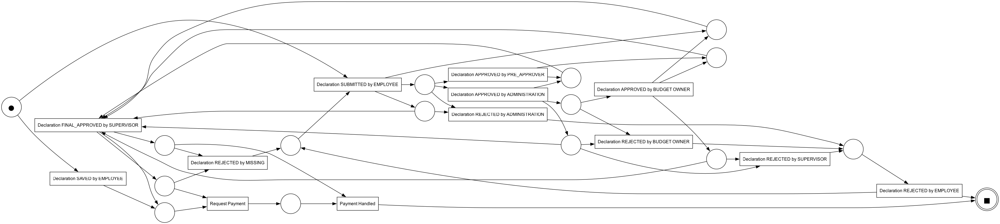

=== Cluster 3: 5851 events, 678 cases ===


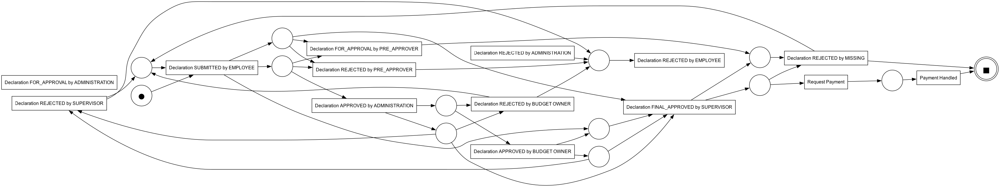

=== Cluster 4: 134 events, 134 cases ===


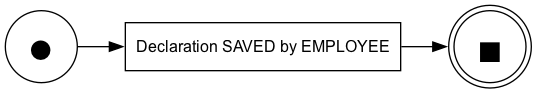

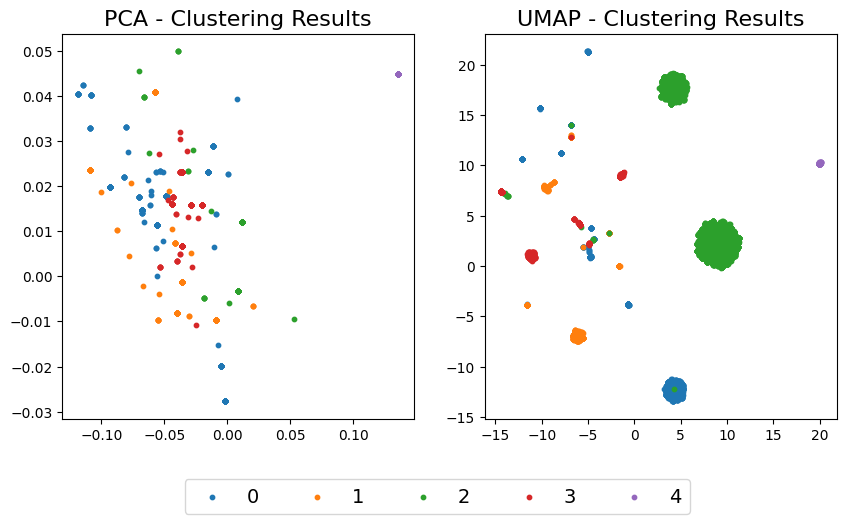

Silhouette Score: 0.6649114848256746


In [55]:
mine_petri_nets(clustered_logs_hierarchical_node2vec_node)
plot_dimension_reduction(clustered_data_hierarchical_node2vec_node.iloc[:, 1:-1], clustered_data_hierarchical_node2vec_node['cluster'])
evaluate_clustering(clustered_data_hierarchical_node2vec_node.iloc[:, 1:-1], clustered_data_hierarchical_node2vec_node["cluster"])

## Clustering with Self-Organizing Maps (SOM) 

### Node2Vec Node Embeddings

In [52]:
clustered_data_som_node2vec_node = cluster_data_som(node2vec_node_embeddings, n_clusters=5)
clustered_logs_som_node2vec_node = split_log_by_clusters(add_clusters_to_log(log, clustered_data_som_node2vec_node))

for cluster, cluster_log in sorted(clustered_logs_som_node2vec_node.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 8361 events, 1715 cases
Cluster 1: 38078 events, 7110 cases
Cluster 3: 4013 events, 863 cases
Cluster 4: 5985 events, 812 cases


=== Cluster 0: 8361 events, 1715 cases ===


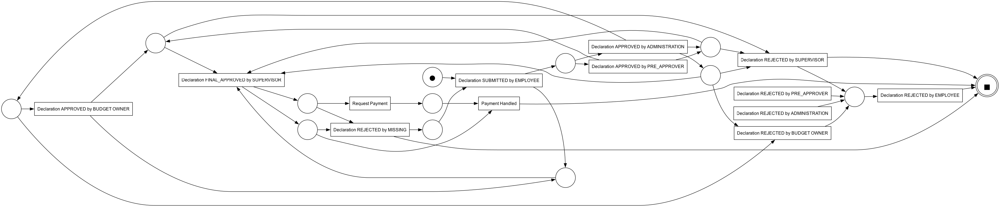

=== Cluster 1: 38078 events, 7110 cases ===


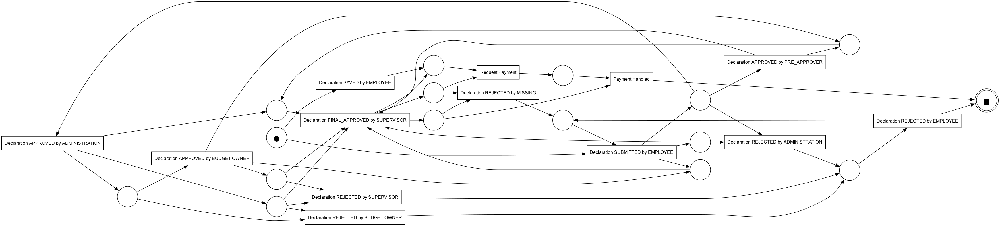

=== Cluster 3: 4013 events, 863 cases ===


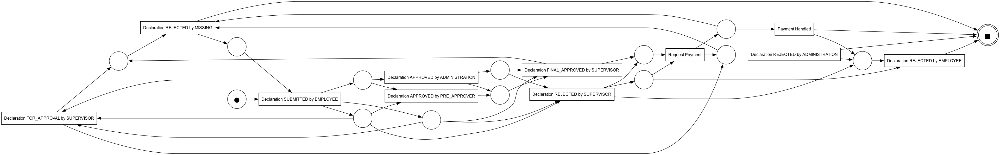

=== Cluster 4: 5985 events, 812 cases ===


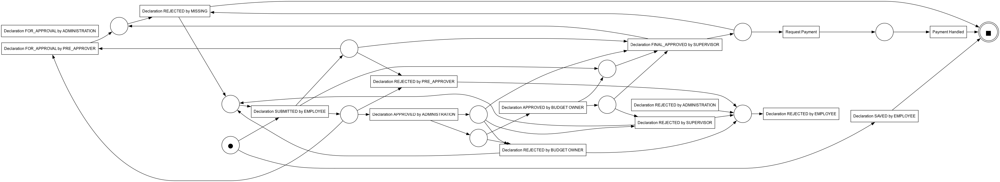

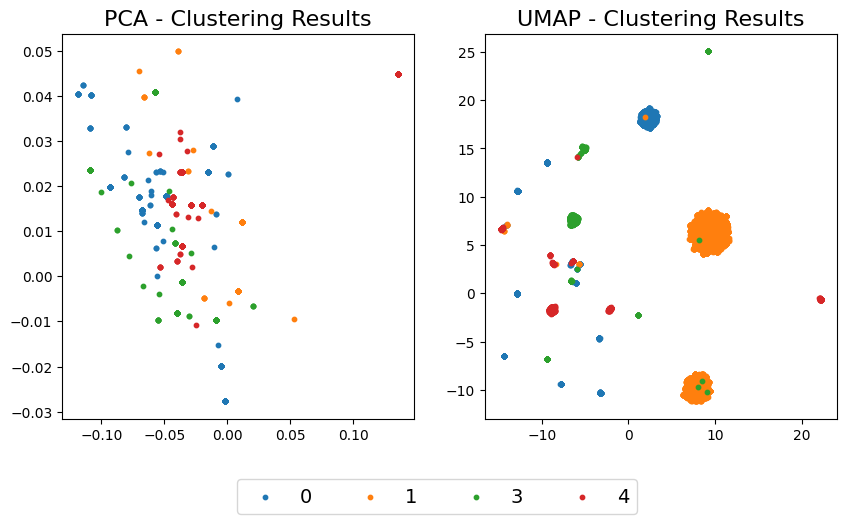

Silhouette Score: 0.6385486630441697


In [53]:
mine_petri_nets(clustered_logs_som_node2vec_node)
plot_dimension_reduction(clustered_data_som_node2vec_node.iloc[:, 1:-1], clustered_data_som_node2vec_node['cluster'])
evaluate_clustering(clustered_data_som_node2vec_node.iloc[:, 1:-1], clustered_data_som_node2vec_node["cluster"])

### GraphWave Embeddings

In [21]:
clustered_data_som_graphWave = cluster_data_som(graphWave_node_embeddings, n_clusters=5)
clustered_logs_som_graphWave = split_log_by_clusters(add_clusters_to_log(log, clustered_data_som_graphWave))

for cluster, cluster_log in sorted(clustered_logs_som_graphWave.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 15159 events, 2521 cases
Cluster 1: 11240 events, 1524 cases
Cluster 2: 134 events, 134 cases
Cluster 3: 1246 events, 311 cases
Cluster 4: 28658 events, 6010 cases


=== Cluster 0: 15159 events, 2521 cases ===


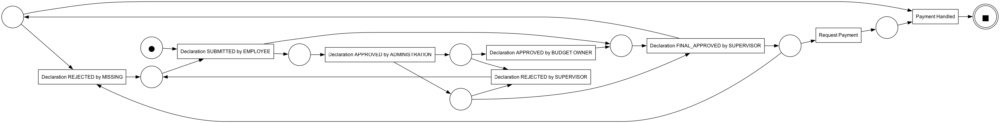

=== Cluster 1: 11240 events, 1524 cases ===


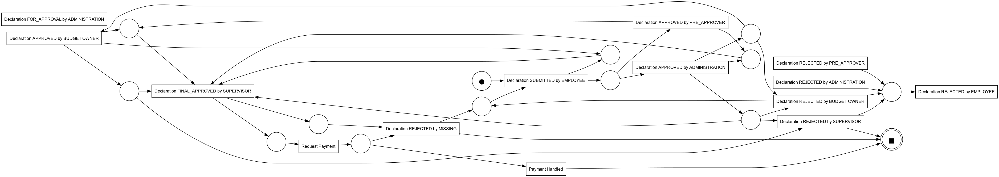

=== Cluster 2: 134 events, 134 cases ===


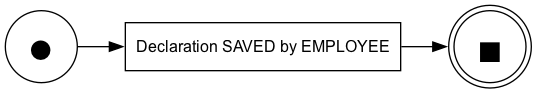

=== Cluster 3: 1246 events, 311 cases ===


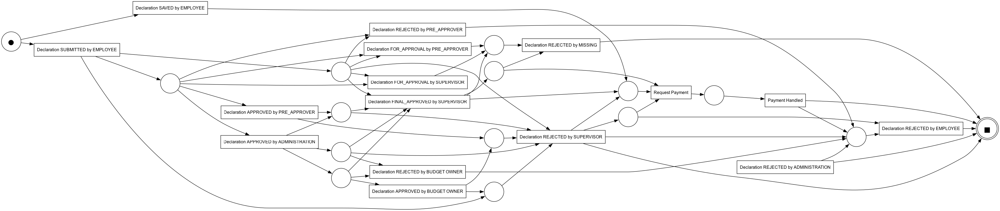

=== Cluster 4: 28658 events, 6010 cases ===


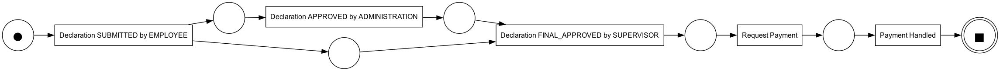

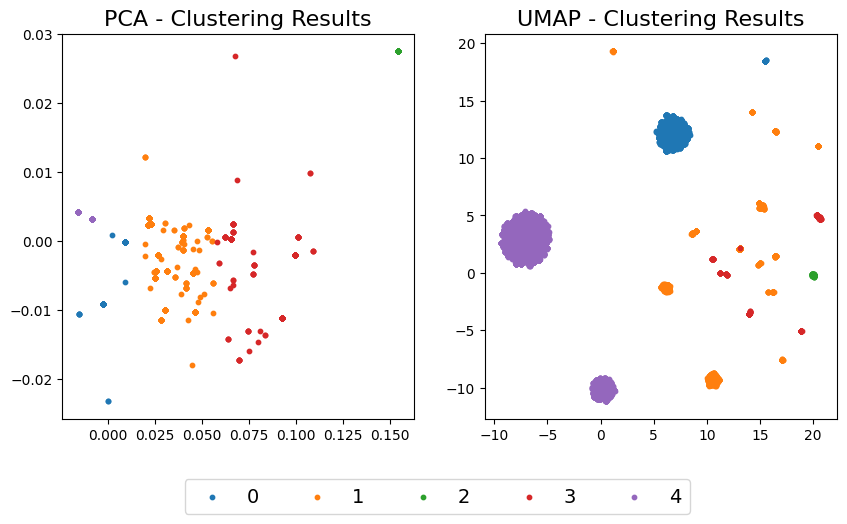

Silhouette Score: 0.8005487042168031


In [22]:
mine_petri_nets(clustered_logs_som_graphWave)
plot_dimension_reduction(clustered_data_som_graphWave.iloc[:, 1:-1], clustered_data_som_graphWave['cluster'])
evaluate_clustering(clustered_data_som_graphWave.iloc[:, 1:-1], clustered_data_som_graphWave["cluster"])

## Clustering with Deep Embedded Clustering (DEC)

### Node2Vec Node Embeddings

In [23]:
clustered_data_dec_node2vec_node = cluster_data_dec(node2vec_node_embeddings, n_clusters=5)
clustered_logs_dec_node2vec_node = split_log_by_clusters(add_clusters_to_log(log, clustered_data_dec_node2vec_node))

for cluster, cluster_log in sorted(clustered_logs_dec_node2vec_node.items()):
    print(f'Cluster {cluster}: {cluster_log.shape[0]} events, {cluster_log["case:concept:name"].unique().shape[0]} cases')

Cluster 0: 23889 events, 4725 cases
Cluster 1: 15082 events, 2617 cases
Cluster 2: 11013 events, 1661 cases
Cluster 3: 5871 events, 1436 cases
Cluster 4: 582 events, 61 cases


=== Cluster 0: 23889 events, 4725 cases ===


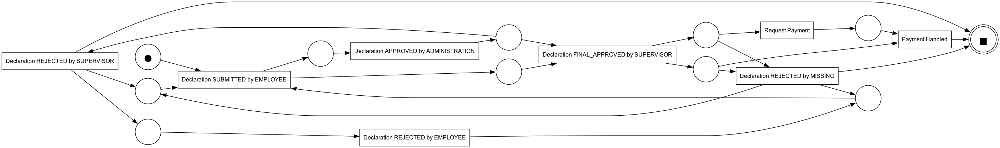

=== Cluster 1: 15082 events, 2617 cases ===


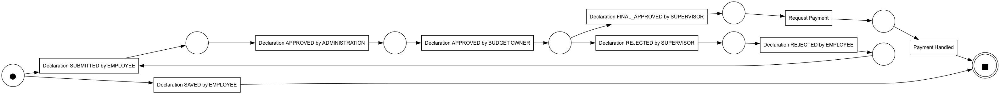

=== Cluster 2: 11013 events, 1661 cases ===


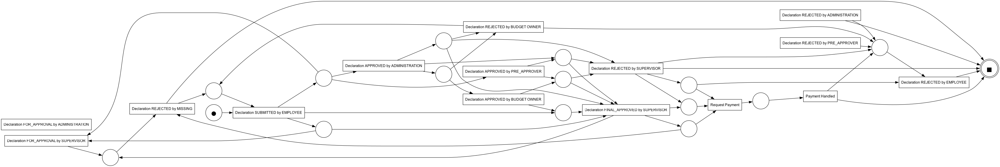

=== Cluster 3: 5871 events, 1436 cases ===


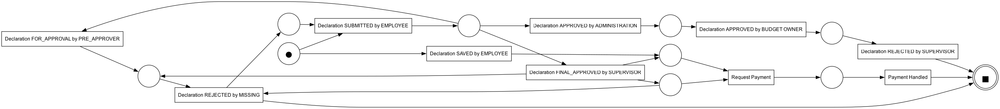

=== Cluster 4: 582 events, 61 cases ===


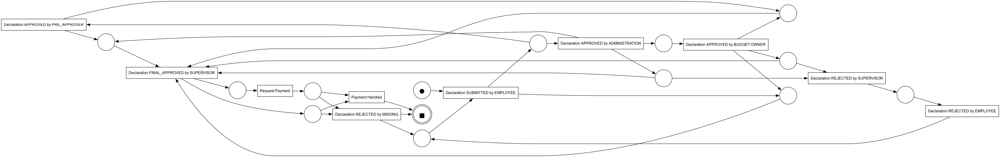

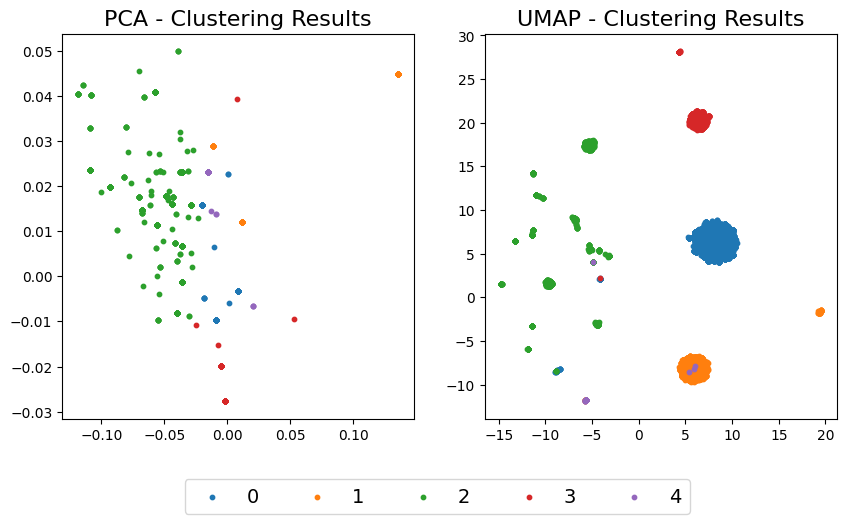

Silhouette Score: 0.7364743222486207


In [24]:
mine_petri_nets(clustered_logs_dec_node2vec_node)
plot_dimension_reduction(clustered_data_dec_node2vec_node.iloc[:, 1:-1], clustered_data_dec_node2vec_node['cluster'])
evaluate_clustering(clustered_data_dec_node2vec_node.iloc[:, 1:-1], clustered_data_dec_node2vec_node["cluster"])

### GraphWave Embeddings

In [38]:
clustered_data_dec_graphWave = cluster_data_dec(graphWave_node_embeddings, n_clusters=5)

In [41]:
clustered_logs_dec_graphWave = split_log_by_clusters(add_clusters_to_log(log, clustered_data_dec_graphWave))

=== Cluster 0: 23090 events, 4618 cases ===


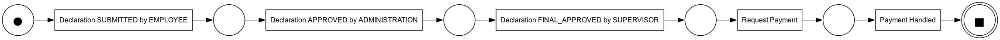

=== Cluster 1: 16168 events, 2779 cases ===


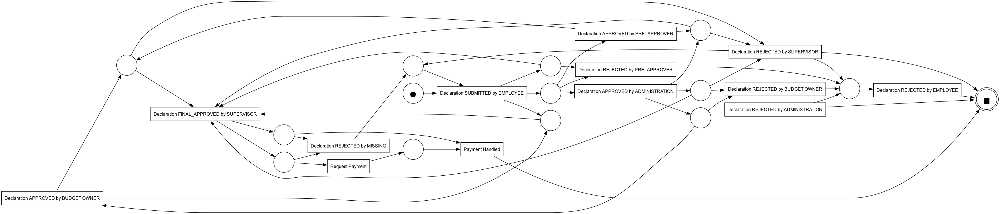

=== Cluster 2: 6524 events, 1654 cases ===


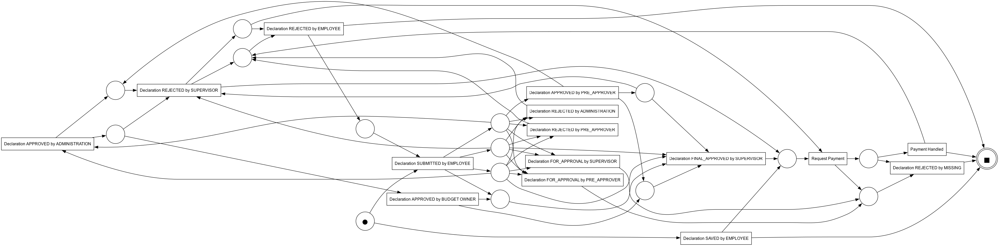

=== Cluster 3: 3550 events, 381 cases ===


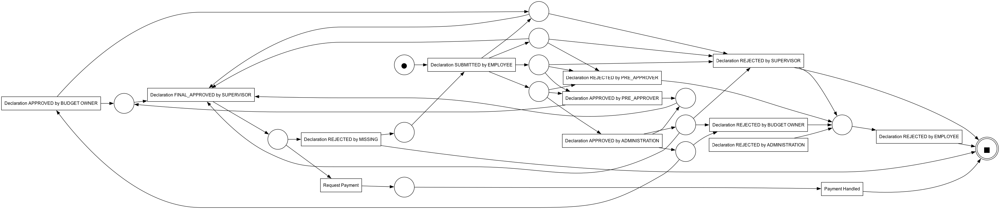

=== Cluster 4: 7105 events, 1068 cases ===


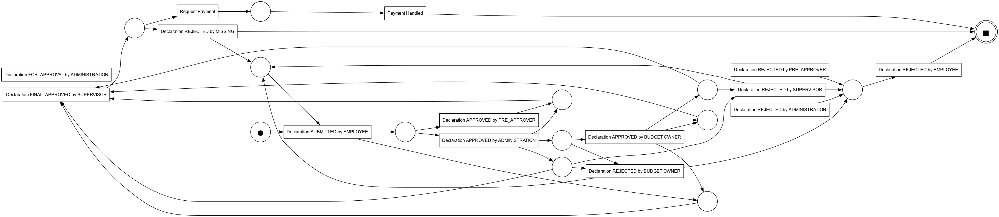

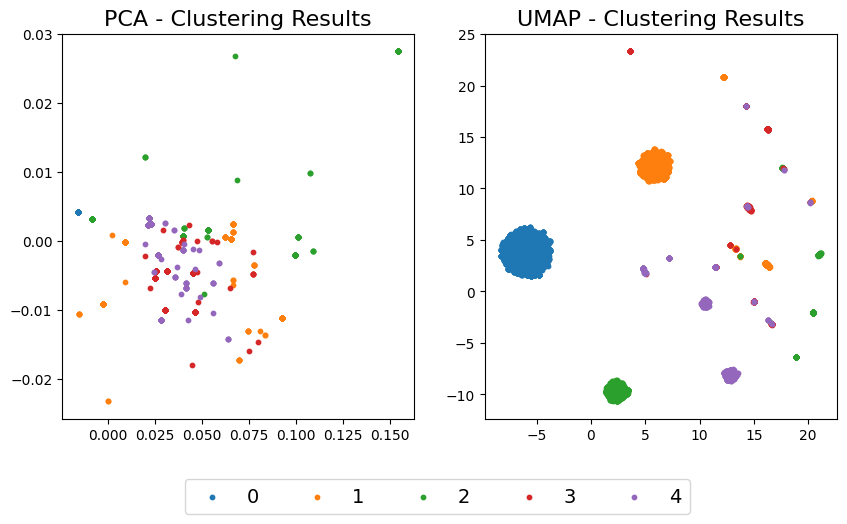

Silhouette Score: 0.5606575939409137


In [42]:
mine_petri_nets(clustered_logs_dec_graphWave)
plot_dimension_reduction(clustered_data_dec_graphWave.iloc[:, 1:-1], clustered_data_dec_graphWave['cluster'])
evaluate_clustering(clustered_data_dec_graphWave.iloc[:, 1:-1], clustered_data_dec_graphWave["cluster"])